In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.regularizers import l1, l2, l1_l2
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import joblib

# **Loading the Dataset**

Loading the dataset from the repository

In [74]:
# loadinf dataset to a pandas data frame
url = "https://raw.githubusercontent.com/MoHoss007/Soccer_players_current_value_prediction/main/data/final_data.csv"
df = pd.read_csv(url)
df

,player,team,name,position,height,age,appearance,goals,assists,yellow cards,...,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
0,/david-de-gea/profil/spieler/59377,Manchester United,David de Gea,Goalkeeper,189.000000,32.0,104,0.000000,0.000000,0.009585,...,1.217252,0.335463,9390,42,5,13,15000000,70000000,1,0
1,/jack-butland/profil/spieler/128899,Manchester United,Jack Butland,Goalkeeper,196.000000,30.0,15,0.000000,0.000000,0.069018,...,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,0
2,/tom-heaton/profil/spieler/34130,Manchester United,Tom Heaton,Goalkeeper,188.000000,37.0,4,0.000000,0.000000,0.000000,...,0.616438,0.924658,292,697,84,4,600000,6000000,1,0
3,/lisandro-martinez/profil/spieler/480762,Manchester United,Lisandro Martínez,Defender Centre-Back,175.000000,25.0,82,0.028090,0.056180,0.224719,...,0.000000,0.000000,6408,175,22,9,50000000,50000000,2,0
4,/raphael-varane/profil/spieler/164770,Manchester United,Raphaël Varane,Defender Centre-Back,191.000000,30.0,63,0.017889,0.017889,0.053667,...,0.000000,0.000000,5031,238,51,21,40000000,80000000,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,/aidan-simmons/profil/spieler/867763,Western Sydney Wanderers,Aidan Simmons,Attack-RightWinger,181.240353,20.0,16,0.175953,0.087977,0.263930,...,0.000000,0.000000,1023,0,0,0,75000,75000,4,1
10750,/kusini-yengi/profil/spieler/708099,Western Sydney Wanderers,Kusini Yengi,Attack Centre-Forward,190.000000,24.0,26,0.372671,0.186335,0.186335,...,0.000000,0.000000,1449,102,18,0,300000,300000,4,0
10751,/nathanael-blair/profil/spieler/1023268,Western Sydney Wanderers,Nathanael Blair,Attack Centre-Forward,181.240353,19.0,20,0.375000,0.000000,0.187500,...,0.000000,0.000000,960,0,0,0,50000,50000,4,0
10752,/zachary-sapsford/profil/spieler/703657,Western Sydney Wanderers,Zachary Sapsford,Attack Centre-Forward,181.240353,20.0,17,0.312139,0.104046,0.000000,...,0.000000,0.000000,865,0,0,0,50000,50000,4,0


Dropping the irrelevant features, encoding of position is removed because its encoding is not what we intended to have, It will be encoded in the preprocessing pipeline.


In [75]:
# dropping features
df = df.drop(['player', 'name', "position_encoded"], axis=1)

The winger flag is a categorical feature but has numerical type so we change it to strings for EDA and then will do the encoding in the preproccessing pipeline.

In [76]:
# Mapping winger value from numerical to categorical
team_map = {0: "False", 1: "True"}
df["winger"] = df["winger"].replace(team_map)
df

,team,position,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,winger
0,Manchester United,Goalkeeper,189.000000,32.0,104,0.000000,0.000000,0.009585,0.0,0.000000,1.217252,0.335463,9390,42,5,13,15000000,70000000,False
1,Manchester United,Goalkeeper,196.000000,30.0,15,0.000000,0.000000,0.069018,0.0,0.000000,1.242331,0.207055,1304,510,58,1,1500000,22000000,False
2,Manchester United,Goalkeeper,188.000000,37.0,4,0.000000,0.000000,0.000000,0.0,0.000000,0.616438,0.924658,292,697,84,4,600000,6000000,False
3,Manchester United,Defender Centre-Back,175.000000,25.0,82,0.028090,0.056180,0.224719,0.0,0.000000,0.000000,0.000000,6408,175,22,9,50000000,50000000,False
4,Manchester United,Defender Centre-Back,191.000000,30.0,63,0.017889,0.017889,0.053667,0.0,0.000000,0.000000,0.000000,5031,238,51,21,40000000,80000000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,Western Sydney Wanderers,Attack-RightWinger,181.240353,20.0,16,0.175953,0.087977,0.263930,0.0,0.000000,0.000000,0.000000,1023,0,0,0,75000,75000,True
10750,Western Sydney Wanderers,Attack Centre-Forward,190.000000,24.0,26,0.372671,0.186335,0.186335,0.0,0.000000,0.000000,0.000000,1449,102,18,0,300000,300000,False
10751,Western Sydney Wanderers,Attack Centre-Forward,181.240353,19.0,20,0.375000,0.000000,0.187500,0.0,0.000000,0.000000,0.000000,960,0,0,0,50000,50000,False
10752,Western Sydney Wanderers,Attack Centre-Forward,181.240353,20.0,17,0.312139,0.104046,0.000000,0.0,0.104046,0.000000,0.000000,865,0,0,0,50000,50000,False


# **EDA**

In [77]:
# listing the features and specifying categorical and numerical features
features = list(df.columns)
features.remove('current_value') # removing the target feature
categorical_features = ["team", "position", "winger"]
numerical_features = [f for f in features if f not in categorical_features]

## **Distribution Analysis**



Getting the distribution of numerical features:

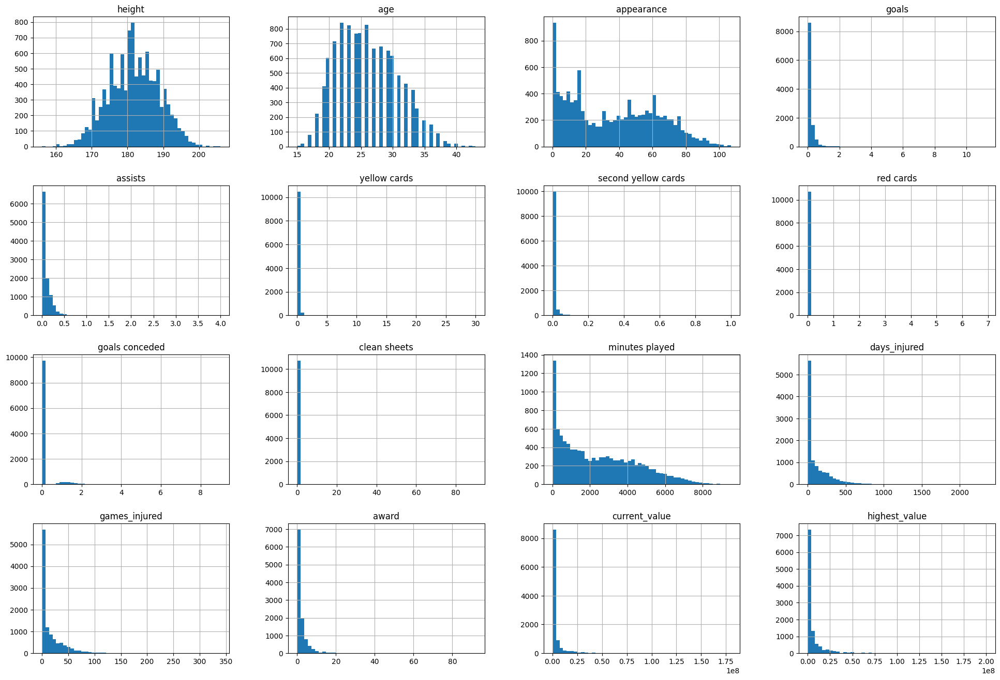

In [78]:
# histogram
df.hist(bins=50, figsize=(24, 16))
plt.show()

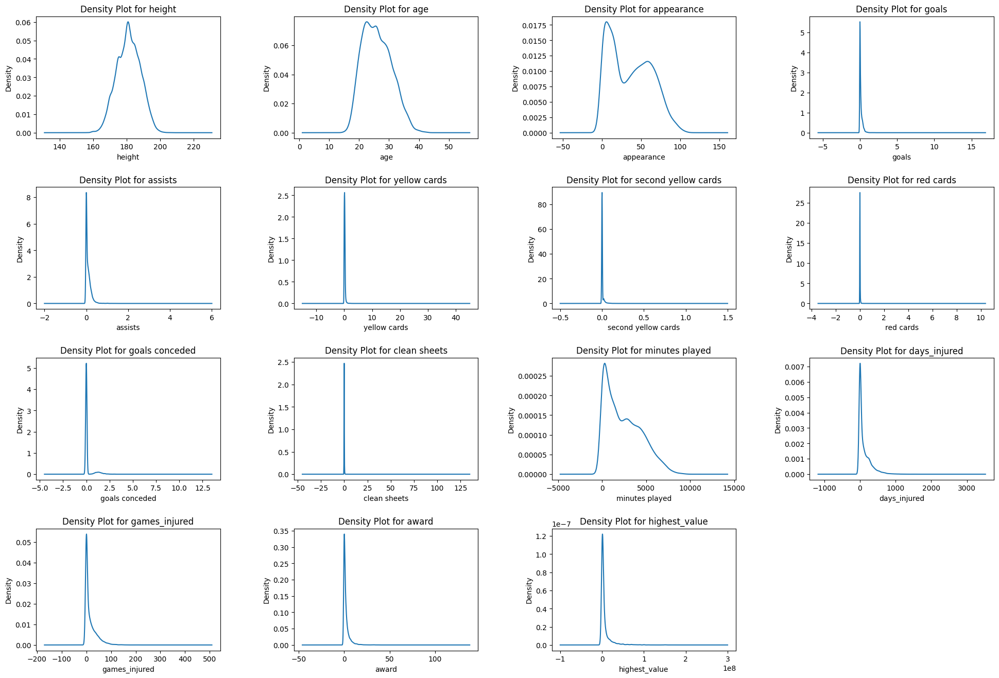

In [79]:
# Density graph for numerical features, the codes puts all distributions in 1 figure
n_features = len(numerical_features)
n_cols = 4
n_rows = n_features // n_cols + (n_features % n_cols > 0)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, 4 * n_rows))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i, feature in enumerate(numerical_features):
    row = i // n_cols
    col = i % n_cols
    if n_rows > 1:
        ax = axs[row, col]
    else:
        ax = axs[col]
    df[feature].plot(kind='density', ax=ax)
    ax.set_title(f'Density Plot for {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Density')

for i in range(n_features, n_rows * n_cols):
    row = i // n_cols
    col = i % n_cols
    if n_rows > 1:
        axs[row, col].axis('off')
    else:
        axs[col].axis('off')

plt.show()

Getting the distribution of categorical features:

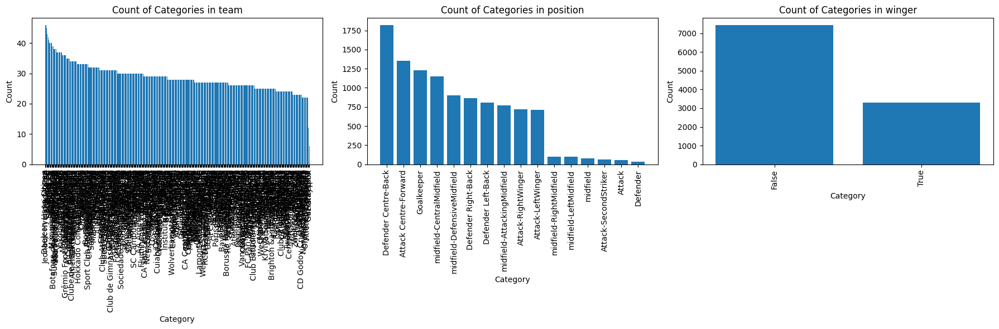

In [80]:
# Distribution graph for categorical features, the codes puts all distributions in 1 figure

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

for i, feature in enumerate(categorical_features):
    value_counts = df[feature].value_counts()
    axes[i].bar(value_counts.index, value_counts.values)
    axes[i].set_title(f'Count of Categories in {feature}')
    axes[i].set_xlabel('Category')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90) # Rotate labels to make them readable

plt.tight_layout()
plt.show()

## **Pairwise Relationships Analysis**

Getting the pairwise plots of numerical features

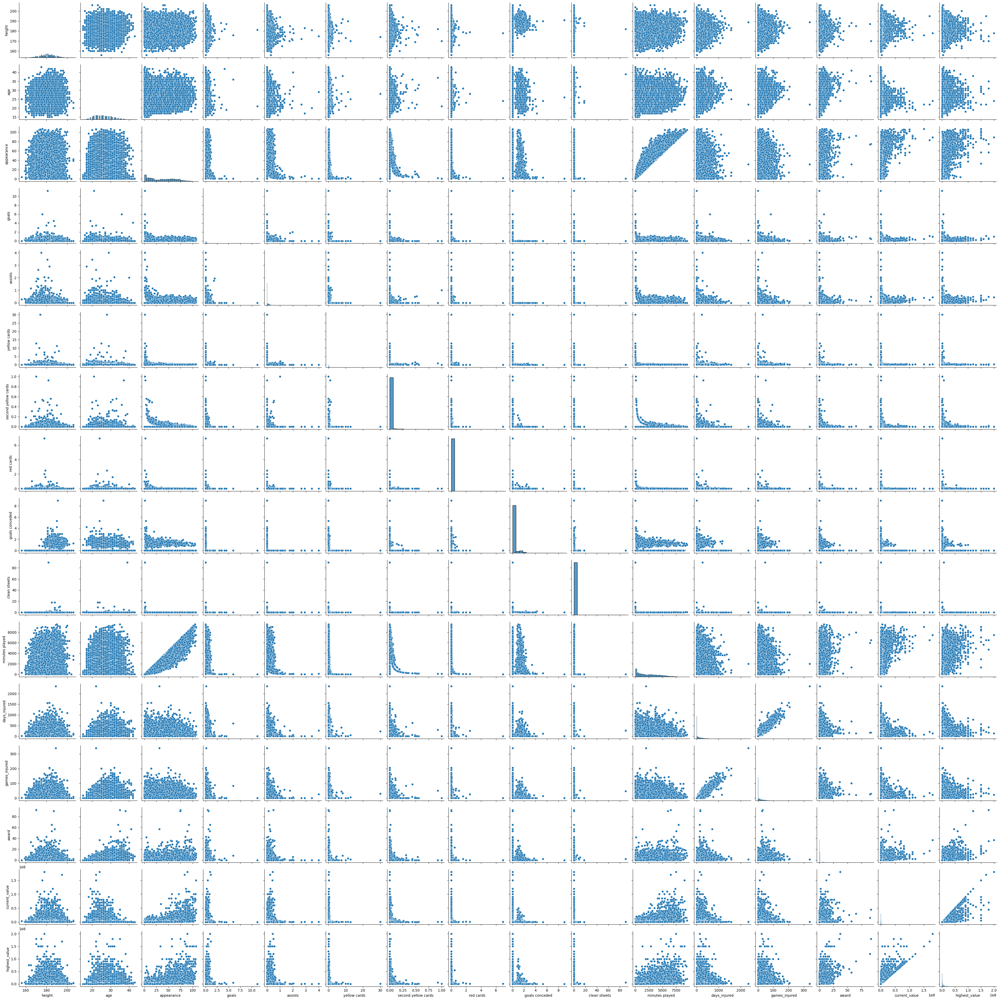

In [81]:
sns.pairplot(df)

We also get the pairwise plots of numerical features with respect to categorical fields of position and winger flag.

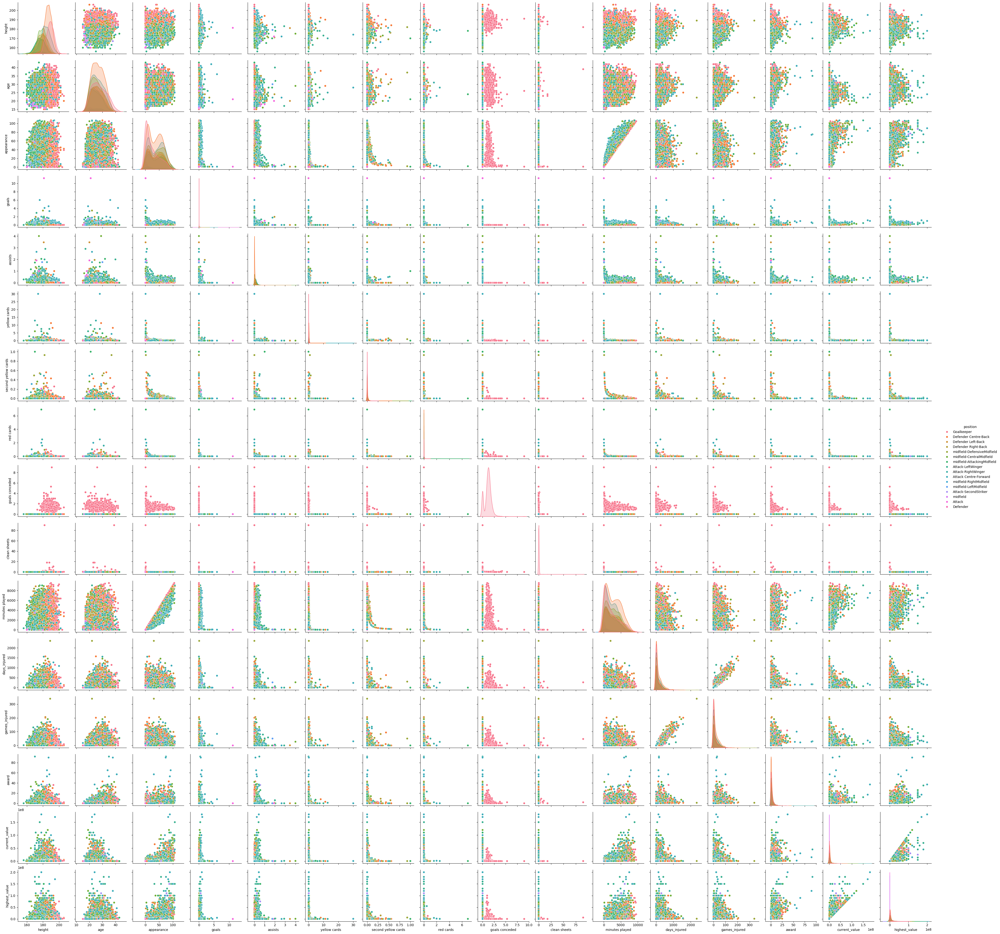

In [82]:
sns.pairplot(df, hue='position')
plt.show()

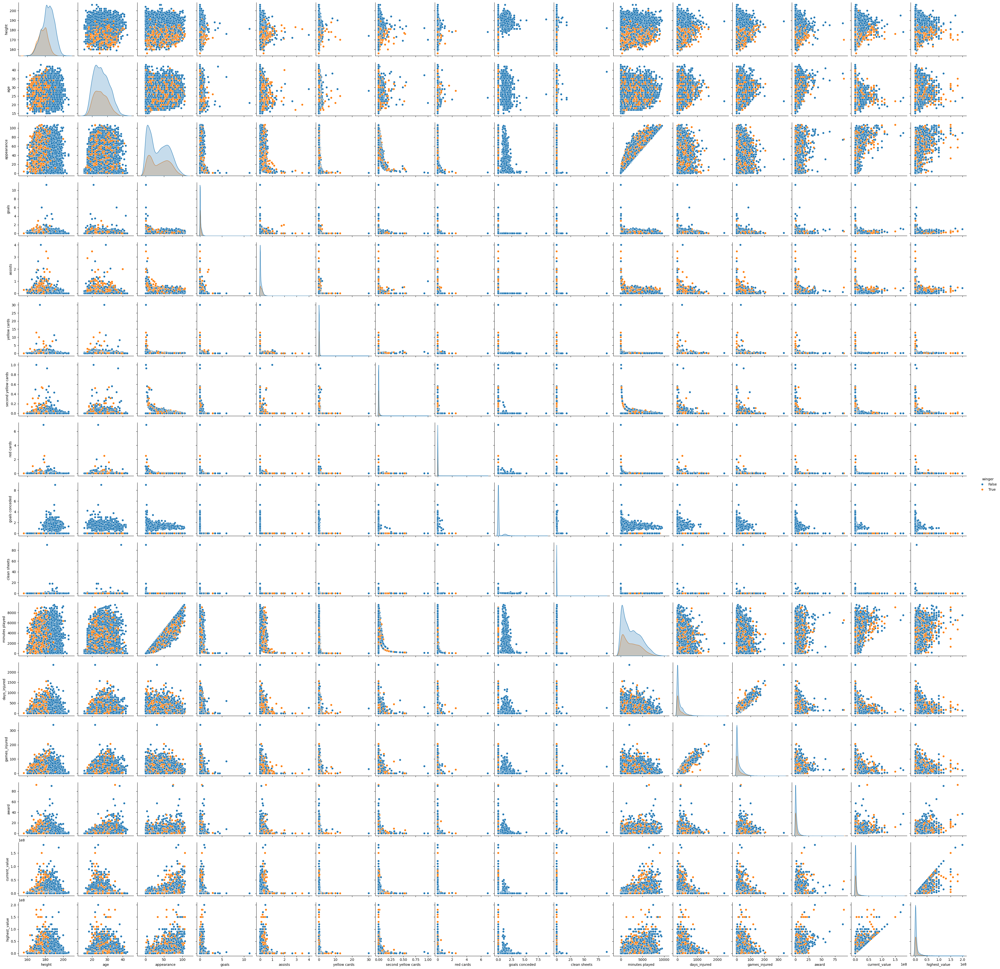

In [83]:
sns.pairplot(df, hue='winger')
plt.show()

## **Correlation Analysis**

Getting the correlation matrix of numerical features to find highly correlated features and get a better understanding of the dataset

In [84]:
#calculating the correlation matrix
corr_matrix = df.corr(numeric_only=True)
corr_matrix

,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value
height,1.000000,0.063652,0.060641,-0.055962,-0.202441,-0.037974,-0.005112,-0.005693,0.333092,0.044366,0.132887,0.059392,0.054902,0.013976,0.040535,0.036776
age,0.063652,1.000000,0.139846,-0.034805,-0.024156,0.007085,0.015529,0.003074,0.083343,0.039064,0.169020,0.324267,0.343029,0.363478,-0.050156,0.123468
appearance,0.060641,0.139846,1.000000,0.131469,0.157186,-0.023092,-0.007436,-0.024514,-0.101384,-0.032515,0.945365,0.127369,0.147528,0.222139,0.419656,0.418394
goals,-0.055962,-0.034805,0.131469,1.000000,0.218266,-0.012826,-0.013974,-0.013940,-0.158107,-0.025811,0.050863,0.037527,0.041696,0.099617,0.121574,0.129037
assists,-0.202441,-0.024156,0.157186,0.218266,1.000000,-0.004430,0.019551,-0.013189,-0.180607,-0.029460,0.081136,0.039431,0.049383,0.091569,0.137415,0.145407
yellow cards,-0.037974,0.007085,-0.023092,-0.012826,-0.004430,1.000000,0.028739,-0.003007,-0.093675,-0.017122,-0.039652,0.011461,0.012892,-0.009052,-0.011766,-0.009772
second yellow cards,-0.005112,0.015529,-0.007436,-0.013974,0.019551,0.028739,1.000000,-0.002562,-0.045840,-0.006770,-0.010411,0.003772,0.007090,-0.015231,-0.013889,-0.014155
red cards,-0.005693,0.003074,-0.024514,-0.013940,-0.013189,-0.003007,-0.002562,1.000000,-0.004584,-0.001778,-0.024402,-0.003650,-0.004764,-0.007886,-0.010171,-0.007257
goals conceded,0.333092,0.083343,-0.101384,-0.158107,-0.180607,-0.093675,-0.045840,-0.004584,1.000000,0.067466,-0.004267,-0.030926,-0.042140,-0.011520,-0.063529,-0.061183
clean sheets,0.044366,0.039064,-0.032515,-0.025811,-0.029460,-0.017122,-0.006770,-0.001778,0.067466,1.000000,-0.020190,0.001275,0.005611,0.002996,-0.011684,-0.008302


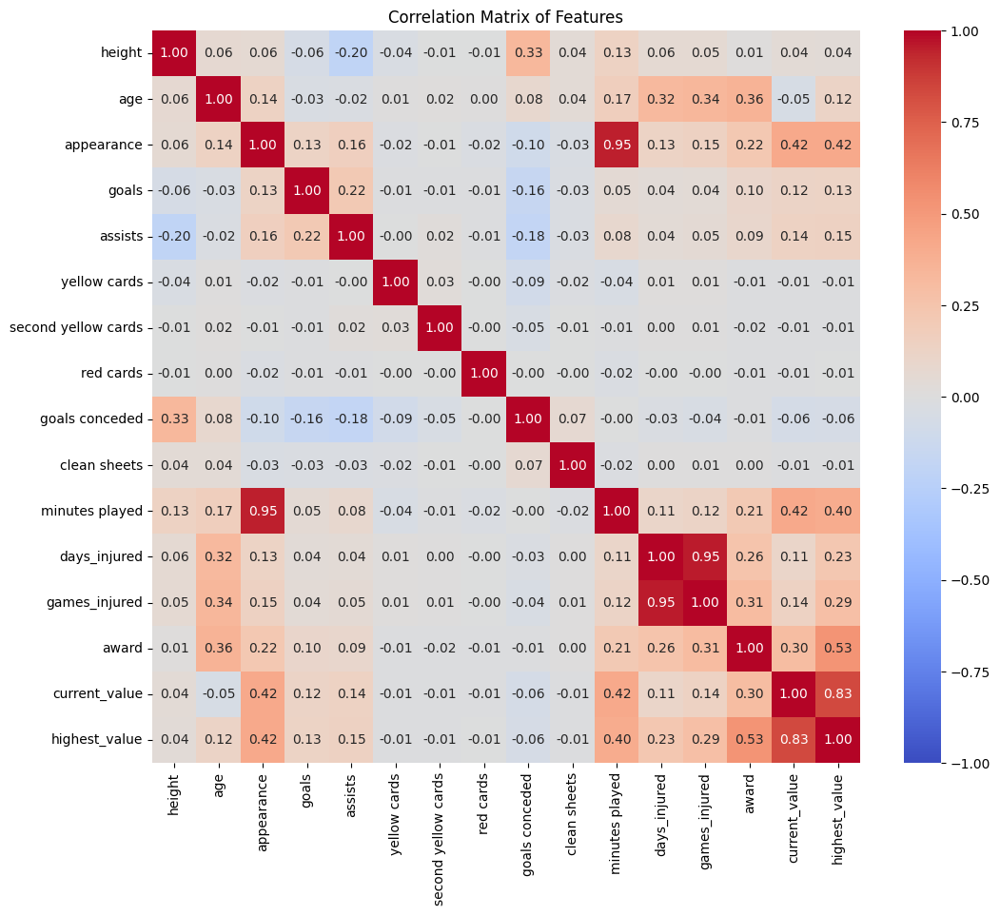

In [85]:
#plotting our correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix of Features")
plt.show()

## **PCA**

Doing PCA on the data to use principle components and avoid irrelevant features, different number of principle components were tested to be used instead of original features, but the accuracy didn't get better.

In [86]:
pca = PCA(n_components=5)

principal_components = pca.fit_transform(df[numerical_features])

df_pca = pd.DataFrame(data=principal_components, columns=[f'Principal Component {i}' for i in range(principal_components.shape[1])])
df_pca

,Principal Component 0,Principal Component 1,Principal Component 2,Principal Component 3,Principal Component 4
0,6.384739e+07,-3068.590292,-279.437816,-23.168463,6.241882
1,1.584739e+07,2122.178416,348.153213,-14.993563,7.365283
2,-1.526061e+05,2168.957026,586.740421,-10.033623,2.655625
3,4.384739e+07,-1292.989709,-80.712288,-3.259324,6.602201
4,7.384739e+07,1893.417176,-102.993948,-13.401064,-13.600779
...,...,...,...,...,...
10749,-6.077606e+06,1081.546897,-98.615051,-1.886440,0.996511
10750,-5.852606e+06,668.871360,3.589257,-0.572493,-5.120269
10751,-6.102606e+06,1142.986089,-98.443423,2.576775,1.245662
10752,-6.102606e+06,1238.015068,-98.300727,0.789063,1.052553


In [87]:
overall_df_pca = pd.concat([df_pca, df[categorical_features + ["current_value"]]], axis=1)
overall_df_pca # data frame for pca

,Principal Component 0,Principal Component 1,Principal Component 2,Principal Component 3,Principal Component 4,team,position,winger,current_value
0,6.384739e+07,-3068.590292,-279.437816,-23.168463,6.241882,Manchester United,Goalkeeper,False,15000000
1,1.584739e+07,2122.178416,348.153213,-14.993563,7.365283,Manchester United,Goalkeeper,False,1500000
2,-1.526061e+05,2168.957026,586.740421,-10.033623,2.655625,Manchester United,Goalkeeper,False,600000
3,4.384739e+07,-1292.989709,-80.712288,-3.259324,6.602201,Manchester United,Defender Centre-Back,False,50000000
4,7.384739e+07,1893.417176,-102.993948,-13.401064,-13.600779,Manchester United,Defender Centre-Back,False,40000000
...,...,...,...,...,...,...,...,...,...
10749,-6.077606e+06,1081.546897,-98.615051,-1.886440,0.996511,Western Sydney Wanderers,Attack-RightWinger,True,75000
10750,-5.852606e+06,668.871360,3.589257,-0.572493,-5.120269,Western Sydney Wanderers,Attack Centre-Forward,False,300000
10751,-6.102606e+06,1142.986089,-98.443423,2.576775,1.245662,Western Sydney Wanderers,Attack Centre-Forward,False,50000
10752,-6.102606e+06,1238.015068,-98.300727,0.789063,1.052553,Western Sydney Wanderers,Attack Centre-Forward,False,50000


# **Data Preprocessing**

Removing highly correlated features, days injured and appearances were highly correlated with games injured and minutes played respectively.

In [88]:
df = df.drop(['days_injured', 'appearance'], axis=1)

checking for Nan and duplicated values

In [89]:
print(df.duplicated().sum()) # printing count of duplicates
df.drop_duplicates(inplace=True)

0


In [90]:
df.isna().sum() # printing count of Nan

team                   0
position               0
height                 0
age                    0
goals                  0
assists                0
yellow cards           0
second yellow cards    0
red cards              0
goals conceded         0
clean sheets           0
minutes played         0
games_injured          0
award                  0
current_value          0
highest_value          0
winger                 0
dtype: int64

Preprocessign pipeline to scale numerical data using standard scaling, and encoding categorical data.

In [91]:
num_cols = df.select_dtypes(include='number').columns.to_list()
num_cols.remove("current_value")  # Exclude the target from numerical columns

# Select categorical columns
cat_cols = df.select_dtypes(exclude='number').columns.to_list()

# Create pipelines for numeric and categorical columns
num_pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
cat_pipeline = make_pipeline(SimpleImputer(strategy='most_frequent'), OrdinalEncoder())

# Use ColumnTransformer to set the estimators and transformations
preprocessing = ColumnTransformer(
    [('num', num_pipeline, num_cols),
     ('cat', cat_pipeline, cat_cols)],
)

In [92]:
preprocessing #visualizing the pipeline

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['height', 'age', 'goals', 'assists',
                                  'yellow cards', 'second yellow cards',
                                  'red cards', 'goals conceded', 'clean sheets',
                                  'minutes played', 'games_injured', 'award',
                                  'highest_value']),
                                ('cat',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder())]),
                                 ['team', 'position', 'winger'])])

In [93]:
#preparing the data using the pipeline
df_prepared = preprocessing.fit_transform(df)
feature_names=preprocessing.get_feature_names_out()
df_prepared = pd.DataFrame(data=df_prepared, columns=feature_names)
df_prepared

,num__height,num__age,num__goals,num__assists,num__yellow cards,num__second yellow cards,num__red cards,num__goals conceded,num__clean sheets,num__minutes played,num__games_injured,num__award,num__highest_value,cat__team,cat__position,cat__winger
0,1.113373e+00,1.247140,-0.532971,-0.606773,-0.416711,-0.184919,-0.084128,2.454353,0.314349,3.422625,-0.463008,2.948703,4.768555,226.0,9.0,0.0
1,2.117750e+00,0.828503,-0.532971,-0.606773,-0.279250,-0.184919,-0.084128,2.511052,0.175438,-0.577159,1.803642,-0.256629,1.183591,226.0,9.0,0.0
2,9.698906e-01,2.293733,-0.532971,-0.606773,-0.438879,-0.184919,-0.084128,1.096013,0.951733,-1.077750,2.915584,0.544704,-0.011398,226.0,9.0,0.0
3,-8.953810e-01,-0.218090,-0.413731,-0.214852,0.080861,-0.184919,-0.084128,-0.297651,-0.048552,1.947563,0.264031,1.880259,3.274820,226.0,6.0,0.0
4,1.400338e+00,0.828503,-0.457033,-0.481975,-0.314755,-0.184919,-0.084128,-0.297651,-0.048552,1.266422,1.504273,5.085590,5.515423,226.0,6.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,-2.527020e-09,-1.264683,0.213940,0.006968,0.171549,-0.184919,-0.084128,-0.297651,-0.048552,-0.716157,-0.676843,-0.523740,-0.453917,365.0,3.0,1.0
10750,1.256856e+00,-0.427408,1.048996,0.693139,-0.007914,-0.184919,-0.084128,-0.297651,-0.048552,-0.505434,0.092963,-0.523740,-0.437112,365.0,1.0,0.0
10751,-2.527020e-09,-1.474001,1.058884,-0.606773,-0.005221,-0.184919,-0.084128,-0.297651,-0.048552,-0.747320,-0.676843,-0.523740,-0.455784,365.0,1.0,0.0
10752,-2.527020e-09,-1.264683,0.792041,0.119074,-0.438879,-0.184919,1.198195,-0.297651,-0.048552,-0.794312,-0.676843,-0.523740,-0.455784,365.0,1.0,0.0


In [94]:
X = df_prepared[feature_names]
 # since we are dealing with large dollar values that are mostly in millions we divide the current value by 1 million, so the unit is million dollar
Y = df["current_value"] / 1_000_000
feature_names

array(['num__height', 'num__age', 'num__goals', 'num__assists',
       'num__yellow cards', 'num__second yellow cards', 'num__red cards',
       'num__goals conceded', 'num__clean sheets', 'num__minutes played',
       'num__games_injured', 'num__award', 'num__highest_value',
       'cat__team', 'cat__position', 'cat__winger'], dtype=object)

# **TRAINING MODELS**

In [95]:
# split into train test validation
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.2, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)

## **Linear/Polynomial Regression**

### **training**

In [96]:
# using grid search to find the best parameters
pipeline = Pipeline([
    ('poly', PolynomialFeatures(include_bias=False)),
    ('linreg', LinearRegression())
])

param_grid = {
    'poly__degree': [1, 2, 3],
    'linreg__fit_intercept': [True, False]
}

grid_search_poly = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)
grid_search_poly.fit(X_train, Y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('poly',
                                        PolynomialFeatures(include_bias=False)),
                                       ('linreg', LinearRegression())]),
             param_grid={'linreg__fit_intercept': [True, False],
                         'poly__degree': [1, 2, 3]},
             scoring='neg_mean_squared_error', verbose=1)

In [97]:
# getting the best model
best_poly_reg_model = grid_search_poly.best_estimator_

best_poly_reg_model_score = best_poly_reg_model.score(X_val, Y_val)
best_parameters = grid_search_poly.best_params_

print(f"score: {best_poly_reg_model_score}")
print(f"best_parameters: {best_parameters}")

score: 0.9234238938661931
best_parameters: {'linreg__fit_intercept': False, 'poly__degree': 2}


### **testing**

In [98]:
# validation error
val_predictions_poly = best_poly_reg_model.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions_poly)
np.sqrt(val_mse)

2.334557601580696

In [99]:
# test error
test_predictions_poly = best_poly_reg_model.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions_poly)
np.sqrt(test_mse)

3.388002413689903

In [100]:
# train error
train_predictions_poly = best_poly_reg_model.predict(X_train)
train_mse = mean_squared_error(Y_train, train_predictions_poly)
np.sqrt(train_mse)

2.4684110050007444

### **visualization**

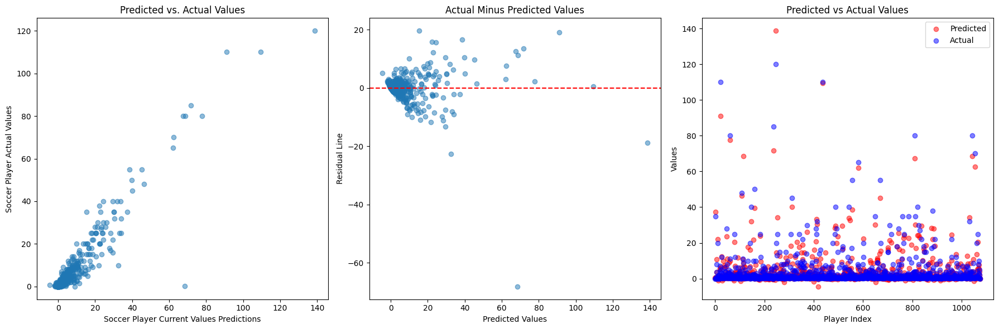

In [101]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# vizualizing scatter plot predicted vs actual
axes[0].scatter(test_predictions_poly, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

# vizualizing residual plot predicted vs actual
residuals = Y_test - test_predictions_poly
axes[1].scatter(test_predictions_poly, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# vizualizing scatter plot predicted vs actual for each player
axes[2].scatter(range(len(test_predictions_poly)), test_predictions_poly, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')

plt.legend()

plt.tight_layout()
plt.show()

## **Random Forest Regression**

### **training**

In [102]:
# using grid search to find the best parameters

rf = RandomForestRegressor()

param_grid = {
    'n_estimators': [25, 50, 100, 150],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5]
}

grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)

grid_search_rf.fit(X_train, Y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 5, 10],
                         'min_samples_split': [2, 5],
                         'n_estimators': [25, 50, 100, 150]},
             scoring='neg_mean_squared_error', verbose=1)

In [103]:
# getting the best model
best_rf_reg_model = grid_search_rf.best_estimator_

best_rf_reg_model_score = best_rf_reg_model.score(X_val, Y_val)
best_parameters = grid_search_rf.best_params_

print(f"score: {best_rf_reg_model_score}")
print(f"best_parameters: {best_parameters}")

score: 0.9071260835897823
best_parameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 50}


### **testing**

In [104]:
# validation error
val_predictions_rf = best_rf_reg_model.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions_rf)
np.sqrt(val_mse)

2.571016325719082

In [105]:
# test error
test_predictions_rf = best_rf_reg_model.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions_rf)
np.sqrt(test_mse)

3.317599685196205

In [106]:
# train error
train_predictions_rf = best_rf_reg_model.predict(X_train)
train_mse = mean_squared_error(Y_train, train_predictions_rf)
np.sqrt(train_mse)

1.2663792319799978

### **visualization**

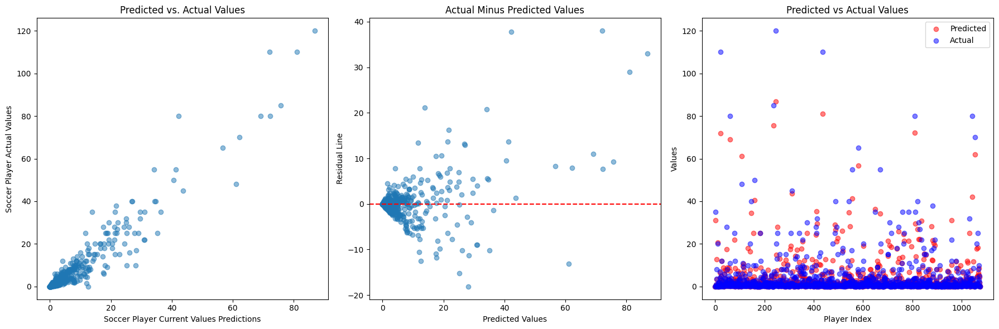

In [107]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# vizualizing scatter plot predicted vs actual
axes[0].scatter(test_predictions_rf, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

# vizualizing residual plot predicted vs actual
residuals = Y_test - test_predictions_rf
axes[1].scatter(test_predictions_rf, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# vizualizing scatter plot predicted vs actual for each player
axes[2].scatter(range(len(test_predictions_rf)), test_predictions_rf, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')


plt.legend()

plt.tight_layout()
plt.show()

## **Neural Network**

### **training**

In [108]:
# model architecture
model_nn = Sequential([
    Dense(256, activation='relu', input_shape=(X_train.shape[1],)),

    Dense(128, activation='relu'),

    Dense(64, activation='relu'),

    Dense(1, activation='linear')
])
model_nn.compile(optimizer='adam', loss='mean_squared_error')

In [109]:
# setting hyperparameters and training
early_stopping = EarlyStopping(monitor='val_loss', patience=20, verbose=1, mode='min', restore_best_weights=True)
history = model_nn.fit(X_train, Y_train, epochs=500, validation_data=(X_val, Y_val), verbose=1, callbacks=[early_stopping], batch_size=32)
# history = model.fit(X_train_temp, Y_train_temp, epochs=500, validation_data=(X_val, Y_val), verbose=1, batch_size=32)

Epoch 1/500
269/269 [==============================] - 2s 3ms/step - loss: 54.4158 - val_loss: 17.6627
Epoch 2/500
269/269 [==============================] - 1s 3ms/step - loss: 23.8105 - val_loss: 19.7390
Epoch 3/500
269/269 [==============================] - 1s 3ms/step - loss: 18.5235 - val_loss: 28.8764
Epoch 4/500
269/269 [==============================] - 1s 3ms/step - loss: 16.6523 - val_loss: 11.6357
Epoch 5/500
269/269 [==============================] - 1s 2ms/step - loss: 14.0223 - val_loss: 11.4031
Epoch 6/500
269/269 [==============================] - 1s 2ms/step - loss: 13.0244 - val_loss: 15.9355
Epoch 7/500
269/269 [==============================] - 1s 2ms/step - loss: 15.1737 - val_loss: 11.3149
Epoch 8/500
269/269 [==============================] - 1s 2ms/step - loss: 12.7744 - val_loss: 13.5374
Epoch 9/500
269/269 [==============================] - 1s 3ms/step - loss: 13.5169 - val_loss: 12.5508
Epoch 10/500
269/269 [==============================] - 1s 4ms/step - los

In [110]:
# visualizing the model
model_nn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 256)               4352      
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                                 
Total params: 45569 (178.00 KB)
Trainable params: 45569 (178.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


### **testing**

In [111]:
# validation error
val_predictions_nn = model_nn.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions_nn)
np.sqrt(val_mse)

34/34 [==============================] - 0s 2ms/step


2.535541187833708

In [112]:
# test error
test_predictions_nn = model_nn.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions_nn)
np.sqrt(test_mse)

34/34 [==============================] - 0s 2ms/step


3.013248623930657

In [113]:
# train error
train_predictions_nn = model_nn.predict(X_train)
train_mse = mean_squared_error(Y_train, train_predictions_nn)
np.sqrt(train_mse)

269/269 [==============================] - 0s 2ms/step


2.4431639089496806

### **visualization**

34/34 [==============================] - 0s 2ms/step


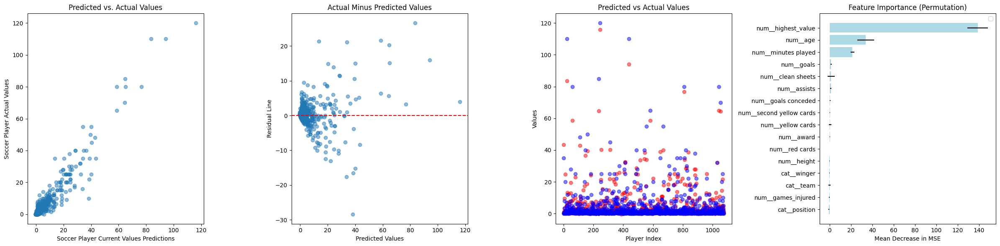

In [114]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 6))

# vizualizing scatter plot predicted vs actual
axes[0].scatter(test_predictions_nn, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

# vizualizing residual plot predicted vs actual
residuals = Y_test - np.squeeze(test_predictions_nn)
axes[1].scatter(test_predictions_nn, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

# vizualizing scatter plot predicted vs actual for each player
axes[2].scatter(range(len(test_predictions_nn)), test_predictions_nn, color='red', label='Predicted', alpha=0.5)
axes[2].scatter(range(len(Y_test)), Y_test, color='blue', label='Actual', alpha=0.5)
axes[2].set_title('Predicted vs Actual Values')
axes[2].set_xlabel('Player Index')
axes[2].set_ylabel('Values')
axes[2].legend


def predict_model(X):
    return model_nn.predict(X).flatten()

# Calculate permutation feature importance
results = permutation_importance(model_nn, X_test, Y_test, n_repeats=10, random_state=42, scoring='neg_mean_squared_error')

# Extract the importances and standard deviations
importances = results.importances_mean
importance_std = results.importances_std

# Sort the features by importance
sorted_idx = np.argsort(importances)

# Creating the plot
axes[3].barh(range(X_test.shape[1]), importances[sorted_idx], xerr=importance_std[sorted_idx], color='lightblue', align='center')
axes[3].set_yticks(range(X_test.shape[1]))
axes[3].set_yticklabels(X_test.columns[sorted_idx])
axes[3].set_title('Feature Importance (Permutation)')
axes[3].set_xlabel('Mean Decrease in MSE')

plt.legend()

plt.tight_layout()
plt.show()

# **Saving the models**

In [115]:
model_nn.save("soccer_current_value_nn.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [116]:
joblib.dump(best_poly_reg_model, 'soccer_current_value_poly_reg.joblib')

['soccer_current_value_poly_reg.joblib']

In [117]:
joblib.dump(best_rf_reg_model, 'soccer_current_value_rf_reg.joblib')

['soccer_current_value_rf_reg.joblib']